## Exploratory Data Analysis of Different Seismic Events

In [1]:
# import all neccessay libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import MarkerCluster

In [2]:
# Load the Dataset
earth_data = pd.read_csv("all_month.csv")

### 1. Load the Dataset 

In [3]:
# Display first 5 record from the dataset
earth_data.head(5)

,time,latitude,longitude,depth,mag,magType,nst,gap,dmin,rms,...,updated,place,type,horizontalError,depthError,magError,magNst,status,locationSource,magSource
0,2024-10-15T02:37:19.770Z,35.896667,-117.693665,2.77,1.05,ml,16.0,70.0,0.06203,0.11,...,2024-10-15T02:39:37.586Z,"20 km ESE of Little Lake, CA",earthquake,0.46,0.80,0.03,3.0,automatic,ci,ci
1,2024-10-15T02:13:34.467Z,59.901700,-152.206600,89.70,1.50,ml,NaN,NaN,NaN,0.13,...,2024-10-15T02:24:38.957Z,"25 km WNW of Anchor Point, Alaska",earthquake,NaN,5.40,NaN,NaN,automatic,ak,ak
2,2024-10-15T02:08:10.310Z,38.819000,-122.742996,1.00,1.08,md,15.0,142.0,0.02252,0.02,...,2024-10-15T02:09:47.169Z,"2 km W of Cobb, CA",earthquake,0.38,0.47,0.14,17.0,automatic,nc,nc
3,2024-10-15T02:05:36.397Z,57.630000,-155.624500,86.40,1.70,ml,NaN,NaN,NaN,0.15,...,2024-10-15T02:08:06.238Z,"70 km W of Karluk, Alaska",earthquake,NaN,1.10,NaN,NaN,automatic,ak,ak
4,2024-10-15T01:50:18.780Z,38.825165,-122.787003,0.85,0.88,md,13.0,71.0,0.01287,0.03,...,2024-10-15T02:39:24.335Z,"6 km WNW of Cobb, CA",earthquake,0.24,0.71,0.18,15.0,automatic,nc,nc


#### Total Number of rows and featues of Earth Data

In [4]:
no_of_records, total_feature = earth_data.shape
print('No of records: ', no_of_records)
print("Total feature: ", total_feature)

No of records:  9026
Total feature:  22


### 2. Statistics of Earth Data

In [5]:
earth_data.describe()

,latitude,longitude,depth,mag,nst,gap,dmin,rms,horizontalError,depthError,magError,magNst
count,9026.000000,9026.000000,9026.000000,9026.000000,7709.000000,7709.000000,7708.000000,9025.000000,7241.000000,9026.000000,7668.000000,7706.000000
mean,38.646467,-116.130968,18.771549,1.481795,24.545337,114.410982,0.370538,0.254335,1.458285,2.581278,0.189773,17.375552
std,18.329995,60.125421,45.784917,1.219201,21.664168,64.505676,1.500426,0.267977,2.956162,16.373228,0.118968,27.207070
min,-60.261500,-179.945900,-3.180000,-1.690000,0.000000,11.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,32.892458,-151.426350,2.672500,0.750000,10.000000,68.000000,0.016510,0.100000,0.260000,0.430000,0.113000,6.000000
50%,38.465167,-122.148583,7.520000,1.300000,19.000000,97.000000,0.045875,0.150000,0.440000,0.710000,0.170169,11.000000
75%,51.895650,-116.216208,13.787500,1.900000,31.000000,146.000000,0.107700,0.290000,0.860000,1.500000,0.233000,20.000000
max,80.287000,179.744300,628.362000,6.600000,328.000000,348.730000,34.121000,2.740000,76.290000,1261.000000,1.980000,484.000000


In [201]:
earth_data['place']

0            20 km ESE of Little Lake, CA
1       25 km WNW of Anchor Point, Alaska
2                      2 km W of Cobb, CA
3               70 km W of Karluk, Alaska
4                    6 km WNW of Cobb, CA
                      ...                
9021               8 km E of Coalinga, CA
9022          7 km SSW of Volcano, Hawaii
9023           5 km SW of Volcano, Hawaii
9024        12 km S of Morton, Washington
9025               7 km WSW of Gilroy, CA
Name: place, Length: 9026, dtype: object

### 3. Features with Null Values

In [202]:
# find columsn with null values
earth_data.isnull().sum()

time                  0
latitude              0
longitude             0
depth                 0
mag                   0
magType               0
nst                1317
gap                1317
dmin               1318
rms                   1
net                   0
id                    0
updated               0
place                 0
type                  0
horizontalError    1785
depthError            0
magError           1358
magNst             1320
status                0
locationSource        0
magSource             0
dtype: int64

In [205]:
# total number of uniques records
print("Total Number of Unique Records: ", earth_data['id'].nunique())

Total Number of Unique Records:  9026


### 4. To visualize correlations between different numerical variables in the dataset.


In [59]:
# check data types of all features
earth_data.dtypes

time                object
latitude           float64
longitude          float64
depth              float64
mag                float64
magType             object
nst                float64
gap                float64
dmin               float64
rms                float64
net                 object
id                  object
updated             object
place               object
type                object
horizontalError    float64
depthError         float64
magError           float64
magNst             float64
status              object
locationSource      object
magSource           object
dtype: object

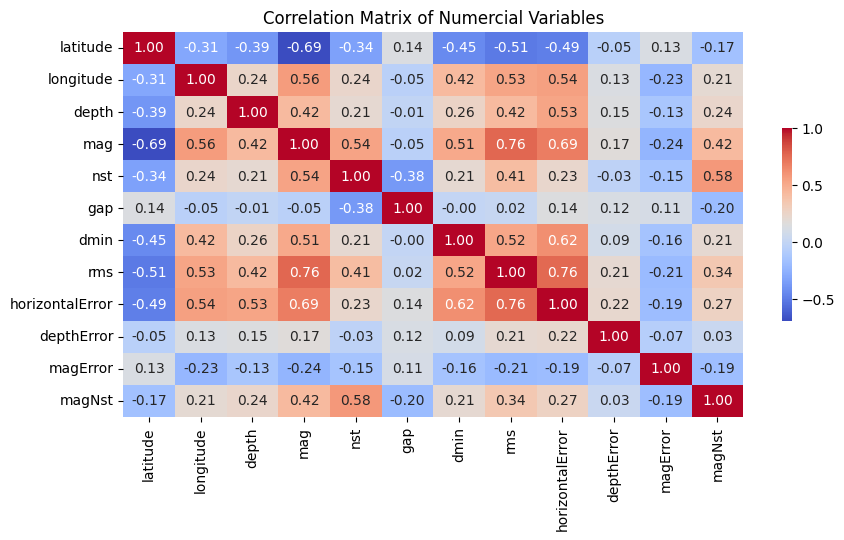

In [60]:
# Select numerical columns for the correlation matrix
df_earth_numeric_data = earth_data.select_dtypes(include='float64')

# Drop any rows with missing values to ensure a clean correlation analysi
df_earth_numeric_data.dropna(inplace=True)

# Calculate the correlation matrix for the numerical data
correlation_matrix = df_earth_numeric_data.corr()

plt.figure(figsize=(10, 5))
sns.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='coolwarm', square=False, cbar_kws={"shrink": .5})
plt.title('Correlation Matrix of Numercial Variables')
plt.show()


Conslusion:
* Latitude and rms (that shows the predictability of the event) have positive relationship 
* Magnitude and horizontal error has positive relationship 
* Magnitude and gap has negative relationship 

### 5. Different Seismic Events and their Frequencies

In [9]:
# Group the DataFrame by the 'type' column and count the number of 'id' entries for each type
type_of_disaster = earth_data.groupby('type')['id'].count()

# Convert the resulting series into a DataFrame and reset the index
df_disaster_types = pd.DataFrame(type_of_disaster).reset_index()
df_disaster_types

,type,id
0,earthquake,8816
1,explosion,74
2,ice quake,1
3,quarry blast,135


## 5.1 Visualization of Distribution of Seismic Events

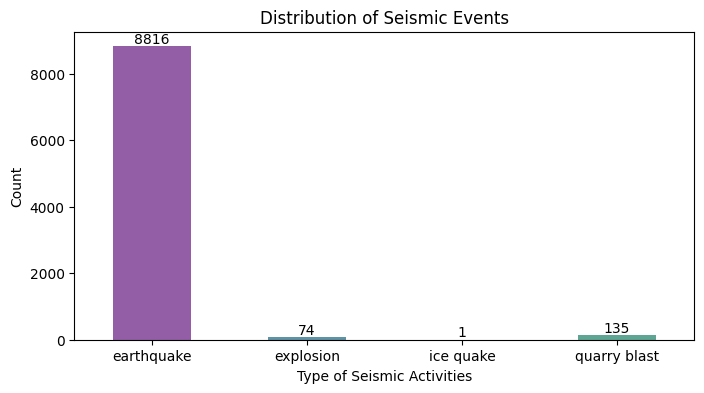

In [10]:
# Create a figure and axis for the plot
fig, ax = plt.subplots(figsize=(8,4))
colors = [(0.4, 0.1, 0.5, 0.7), (0.1, 0.4, 0.5, 0.7), (0.5, 0.4, 0.1, 0.7), 
          (0.1, 0.5, 0.4, 0.7), (0.3, 0.3, 0.3, 0.7), (0.4, 0.1, 0.5, 0.7)] 
ax = df_disaster_types.set_index('type')['id'].plot(kind='bar', ax=ax, color=colors,)

# Annotate each bar with its height (count) in one line
for idx, value in enumerate(df_disaster_types['id']):
    ax.text(idx, value + 1, str(value), ha='center', va='bottom')

ax.set_title('Distribution of Seismic Events')
ax.set_ylabel('Count')
ax.set_xlabel('Type of Seismic Activities')

# Rotate x-axis tick labels for better readability
plt.xticks(rotation=0)
plt.show()

Conclusion:
* Earthquake ocouring naturely has highest number of occurences in the past one month
* Ice quake has the lowest occurence

### 6. Interactive Map Visualization of Seismic Events with Folium

#### 6.1 Map Visualization of Different Seismic Events

In [57]:
# Create a base map centered on the mean latitude and longitude of the earthquake data
m = folium.Map(location=[earth_data['latitude'].mean(), earth_data['longitude'].mean()], zoom_start=4)

# Create a marker cluster to group nearby markers together
marker_cluster = MarkerCluster().add_to(m)

# assign colors to different types of disasters
disaster_colors = {
    'earthquake': 'red',
    'explosion': 'orange',
    'quarry blast': 'brown',
    'ice quack': 'blue'
}

# Add markers for each location
for idx, row in earth_data.iterrows():
    color = disaster_colors.get(row['type'])
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        popup=f"{row['place']}<br>Type: {row['type']}",  # Popup text displaying place and type
        icon=folium.Icon(color=color)  # Customize marker color
    ).add_to(marker_cluster)

# In a Jupyter Notebook, this will display the map inline
m  

C:\Users\HP\AppData\Local\Temp\ipykernel_22372\2622879769.py:21: UserWarning: color argument of Icon should be one of: {'lightblue', 'lightred', 'lightgray', 'beige', 'orange', 'white', 'lightgreen', 'cadetblue', 'blue', 'gray', 'darkred', 'darkpurple', 'green', 'pink', 'purple', 'red', 'black', 'darkgreen', 'darkblue'}.
  icon=folium.Icon(color=color)  # Customize marker color


#### 6.2 Heatmap generation using location of different Sieimic Events

In [58]:
from folium.plugins import HeatMap
# Create a base map centered on the mean latitude and longitude of the earthquake data
m = folium.Map(location=[earth_data['latitude'].mean(), earth_data['longitude'].mean()], zoom_start=6)

# Prepare data for the heatmap
heat_data = [[row['latitude'], row['longitude']] for idx, row in earth_data.iterrows()]

# Add the heatmap layer to the map
HeatMap(heat_data, radius=12).add_to(m)

# In a Jupyter Notebook, this will display the map inline
m 

Conclusion:
* Large number of seismic activities can be observed on the Southern side of Alaska 
* Large number of seismic activities can be observed on the Western side of United States 
* Large number of seismic activities can be observed on the Eestern side of Malaysia and Indonesia 

### 7. Visualization of different Seismic Event Magnitudes to find data distribution, central tendency and outliers detetction of different seismic events

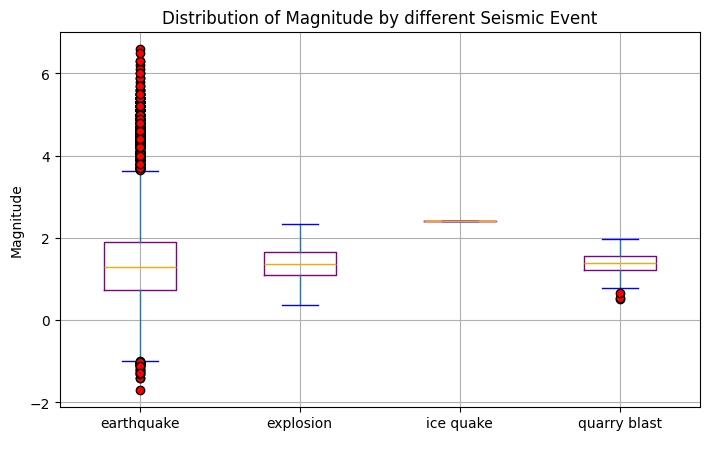

In [16]:
# Create a figure and axis for the plot
fig, ax = plt.subplots(figsize=(8, 5))

# Create a box plot showing the distribution of magnitudes for each type of seismic event
df_seismic_magnitude = earth_data[['mag', 'type']]
df_seismic_magnitude.boxplot(column='mag', by='type', ax=ax, boxprops=dict(color='purple'), # Change box color
                              medianprops=dict(color='orange'), # Change median line color
                              capprops=dict(color='blue'), # Change cap color
                              flierprops=dict(markerfacecolor='red', marker='o')) # Change outlier marker

# Set titles and labels
ax.set_title('Distribution of Magnitude by different Seismic Event')
ax.set_ylabel('Magnitude')
ax.set_xlabel(' ')

# Rotate x-axis tick labels for better readability
plt.xticks(rotation=0)

# Remove the default title added by the boxplot function
plt.suptitle('')

# Show the plot
plt.show()


### 8. Temporal Analysis: Visualize Earthquake Magnitude with Time

C:\Users\HP\AppData\Local\Temp\ipykernel_22372\684479753.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_magnitude['time'] = pd.to_datetime(df_magnitude['time'])


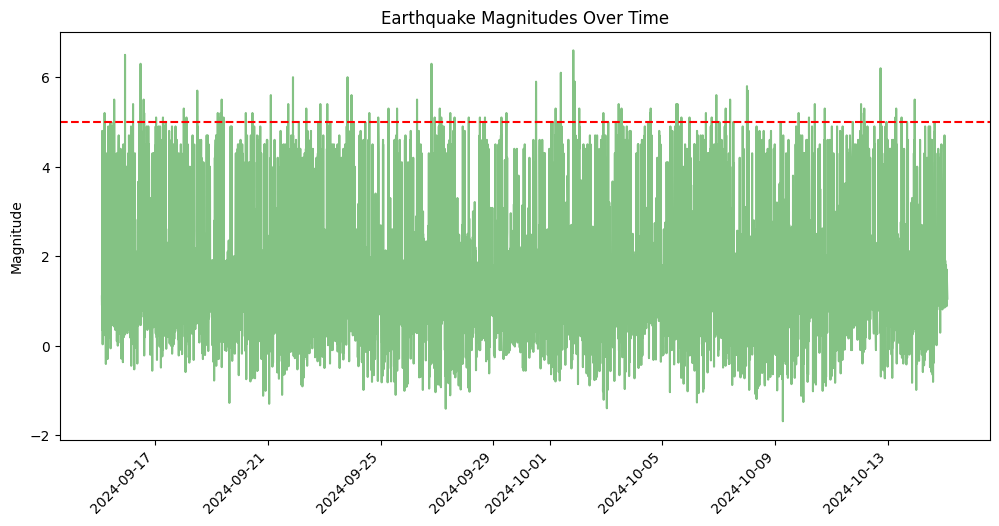

In [19]:
# Filter the DataFrame to include only rows where the 'type' is 'earthquake'
df_magnitude = earth_data[(earth_data['type'] == 'earthquake')]

# Convert the 'time' column to datetime format and store it in a new 'date' column
df_magnitude['time'] = pd.to_datetime(df_magnitude['time'])

# Select only the 'date' and 'mag' columns from the DataFrame
df_magnitude = df_magnitude[['time', 'mag']]

# Create a figure and axis for plotting with a specified figure size
fig, ax = plt.subplots(figsize=(12, 6))
df_magnitude.set_index('time')['mag'].plot(kind='line', ax=ax, color=(0.4, 0.7, 0.4, 0.8))

# Add a horizontal line at y=5 to indicate a threshold for significant magnitudes
ax.axhline(y=5, color='red', linestyle='--', label='Magnitude above 5')

ax.set_title('Earthquake Magnitudes Over Time')
ax.set_xlabel('')
ax.set_ylabel('Magnitude')

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)
plt.show()


In [41]:
# Filter the dataframe to include only earthquakes with magnitude greater than or equal to 5.0
df_magnitude_above_5 = df_magnitude[(df_magnitude['mag']>=5)]

# Calculate the percentage of earthquakes with a magnitude above or equal to 5.0
percentage_of_magnitude_above_5 = round(len(df_magnitude_above_5[['mag']])*100/len(df_magnitude[['mag']]), 2)
print(f"Percentage of earthquakes with magnitude >= 5.0: {percentage_of_magnitude_above_5}%")

Percentage of earthquakes with magnitude >= 5.0: 1.21%


### Depth vs. Magnitude Analysis of Earthquake

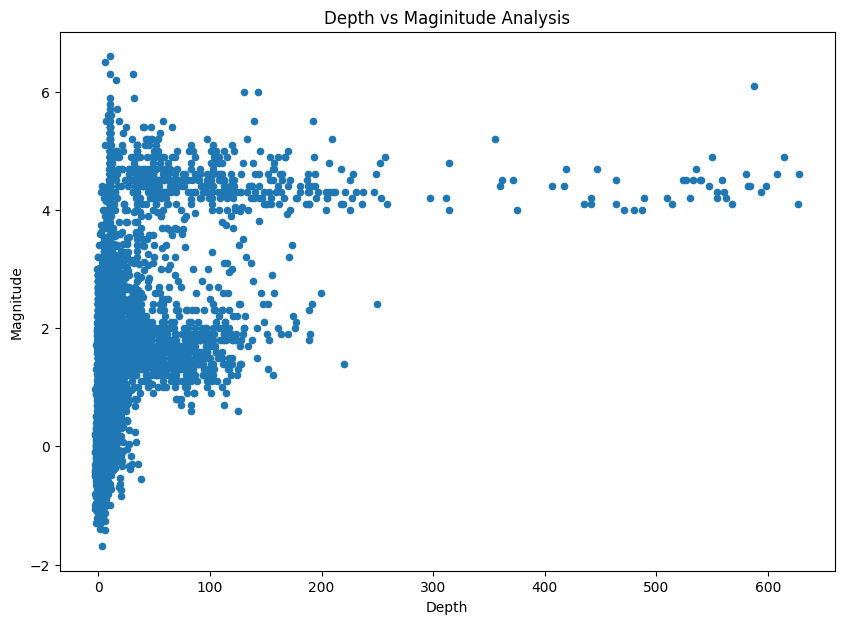

In [56]:
# Filter the dataframe to get only earthquake data
df_depth_magnitude= earth_data[(earth_data['type']=='earthquake')]

# Filter the dataframe to include only depth and magnitude
df_depth_magnitude = df_depth_magnitude[['depth', 'mag']]

# Create a figure and axis for plotting with a specified figure size
fig, ax = plt.subplots(figsize=(10,7))
df_depth_magnitude.plot(kind='scatter', x='depth', y='mag', ax=ax)

# Set titles and labels of both axis
ax.set_title('Depth vs Maginitude Analysis')
ax.set_ylabel('Magnitude')
ax.set_xlabel('Depth')

# Rotate x-axis tick labels for better readability
plt.xticks(rotation=0)
plt.show()

time                object
latitude           float64
longitude          float64
depth              float64
mag                float64
magType             object
nst                float64
gap                float64
dmin               float64
rms                float64
net                 object
id                  object
updated             object
place               object
type                object
horizontalError    float64
depthError         float64
magError           float64
magNst             float64
status              object
locationSource      object
magSource           object
dtype: object

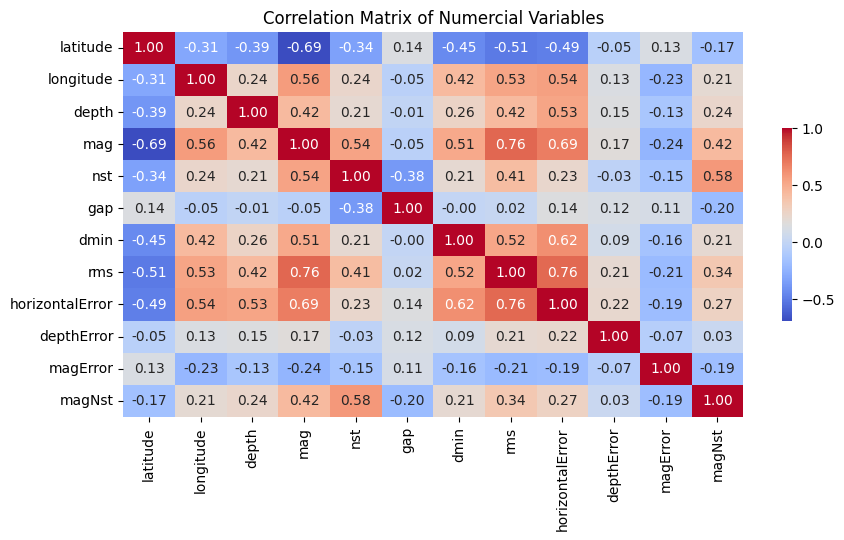